In [0]:
# mount personal google drive
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
# get data from pickle
import sys
import time
import pickle
import matplotlib.pyplot as plt
import numpy as np

import data_preprocessing

run_data_preprocessing = False
try:
    # check if an argument is provided
    sys.argv[1]
except:
    pass
else:
    if sys.argv[1].lower() == 'true':
        # if an argument with indicating a boolean True is passed in, then
        # run data preprocessing (load datasets and calculate spectrograms)
        run_data_preprocessing = True

if run_data_preprocessing:
    st_data_preprocessing = time.time()
    data_preprocessing.data_preprocessing()
    print('The total time used for loading and preprocessing the data was', time.time() - st_data_preprocessing)

# Use the following to load spectrograms:
# modify name_suffix to choose dataset
name_suffix = '_1024'
gtzan_spectrograms = pickle.load(open('drive/My Drive/vgg/mgc_dataset/gtzan_spectrograms_3 name_suffix + '.p', 'rb'))
gtzan_labels = pickle.load(open('drive/My Drive/vgg/mgc_dataset/gtzan_labels_labels_3_1024.p', 'rb'))

print(gtzan_spectrograms.shape)
print(gtzan_labels.shape)


(257, 858)
(1359, 257, 858)
(1500, 257, 858)
(1359,)
(1500,)


780
790


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


800
810
820
830
840
850
860
870
880


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log10
  del sys.path[0]


890
900
910
920
930
940
950
960
970
980
990
1000
1010
1020
1030
1040
1050
1060
1070
1080
1090
1100
1110
1120
1130
1140
1150
1160
1170
1180
1190
1200
1210
1220
1230
1240
1250
1260
1270
1280
1290
1300
1310
1320
1330
1340
1350
1360
1370
1380
1390
1400
1410
1420
1430
1440
1450
1460
1470
1480
1490


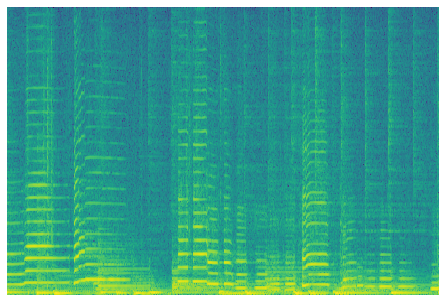

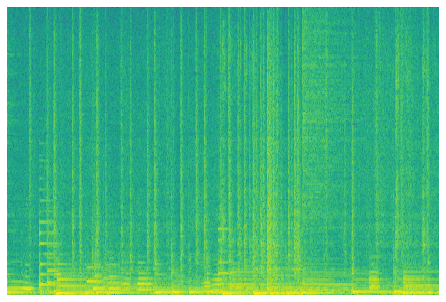

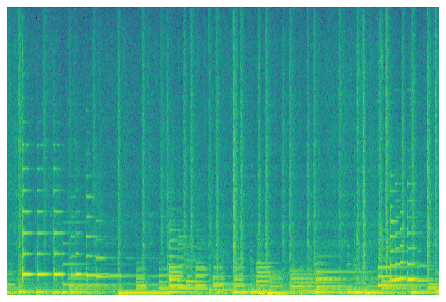

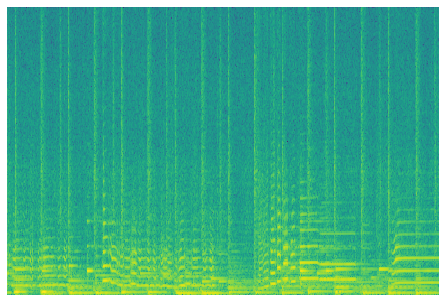

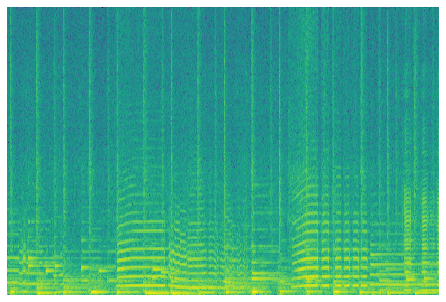

...

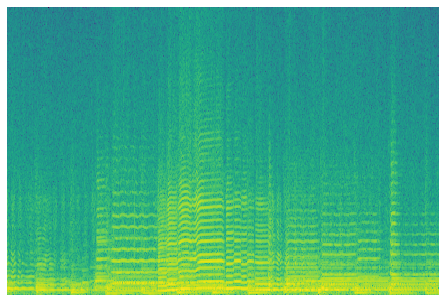

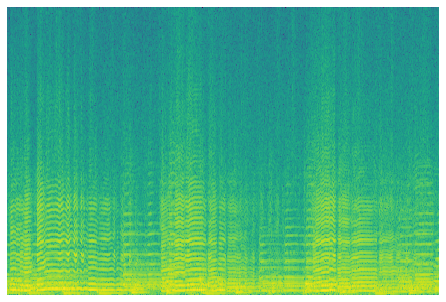

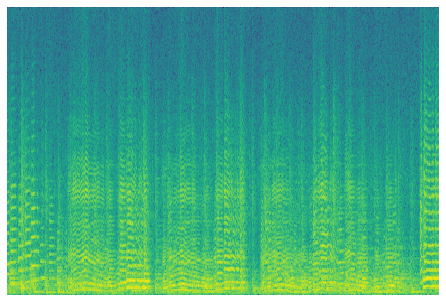

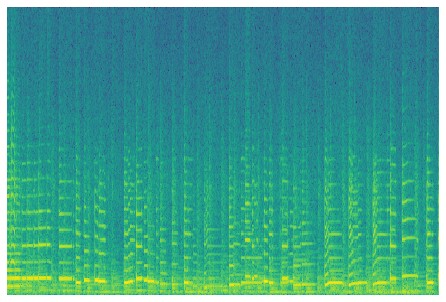

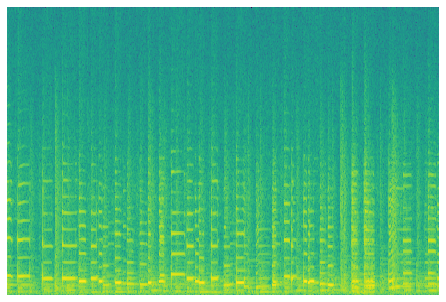

Error in callback <function flush_figures at 0x7febcf6941e0> (for post_execute):


KeyboardInterrupt: ignored

In [0]:
    # extract spectrogram from plot
    from PIL import Image
    for i in range(len(gtzan_spectrograms)):
        if i % 10 == 0:
          print(i)
        spectrogram = gtzan_spectrograms[i]
        label = gtzan_labels[i]
        #print(label)
        fig = plt.figure(frameon=False)
        ax = plt.Axes(fig, [0., 0., 1., 1.])
        ax.set_axis_off()
        fig.add_axes(ax)
        plt.pcolormesh(10 * np.log10(spectrogram))
        plt.savefig('drive/My Drive/vgg/vggdataset/' + str(label) + '/' + str(i) + '.jpg')

In [0]:
# load subprocess to run command
import subprocess
subprocess.run(["sudo", "apt-get", "install", "mmv"])

CompletedProcess(args=['sudo', 'apt-get', 'install', 'mmv'], returncode=0)

In [0]:
# split the test set out
subprocess.run(["mmv", "drive/My Drive/vgg/vggdataset/0/2*9.jpg", "drive/My Drive/vgg/test/0-#1.jpg"])
subprocess.run(["mmv", "drive/My Drive/vgg/vggdataset/1/5*9.jpg", "drive/My Drive/vgg/test/1-#1.jpg"])
subprocess.run(["mmv", "drive/My Drive/vgg/vggdataset/2/8*9.jpg", "drive/My Drive/vgg/test/2-#1.jpg"])
subprocess.run(["mmv", "drive/My Drive/vgg/vggdataset/3/11*9.jpg", "drive/My Drive/vgg/test/3-#1.jpg"])
subprocess.run(["mmv", "drive/My Drive/vgg/vggdataset/4/14*9.jpg", "drive/My Drive/vgg/test/4-#1.jpg"])

CompletedProcess(args=['mmv', 'drive/My Drive/vgg/vggdataset/4/14*9.jpg', 'drive/My Drive/vgg/test/4-#1.jpg'], returncode=0)

In [0]:
subprocess.run(["mmv", "drive/My Drive/vgg/vggdataset/0/2*[6...9].jpg", "drive/My Drive/vgg/newtest/0-#1.jpg"])
subprocess.run(["mmv", "drive/My Drive/vgg/vggdataset/1/5*9.jpg", "drive/My Drive/vgg/newtest/1-#1.jpg"])
subprocess.run(["mmv", "drive/My Drive/vgg/vggdataset/2/8*9.jpg", "drive/My Drive/vgg/newtest/2-#1.jpg"])
subprocess.run(["mmv", "drive/My Drive/vgg/vggdataset/3/11*9.jpg", "drive/My Drive/vgg/newtest/3-#1.jpg"])
subprocess.run(["mmv", "drive/My Drive/vgg/vggdataset/4/14*9.jpg", "drive/My Drive/vgg/newtest/4-#1.jpg"])

CompletedProcess(args=['mmv', 'drive/My Drive/vgg/vggdataset/4/14*9.jpg', 'drive/My Drive/vgg/newtest/4-#1.jpg'], returncode=1)

In [0]:
# create and read tf record file

import os
import tensorflow as tf
from PIL import Image
import sys

def creat_tf(imgpath):

    cwd = os.getcwd()
    classes = os.listdir(cwd + imgpath)
    # reference [1]
    writer = tf.python_io.TFRecordWriter("train.tfrecords")
    for index, name in enumerate(classes):
        class_path = cwd + imgpath + name + "/"
        print(class_path)
        if os.path.isdir(class_path):
            for img_name in os.listdir(class_path):
                img_path = class_path + img_name
                img = Image.open(img_path)
                img = img.resize((224, 224))
                #changing the image to byte
                img_raw = img.tobytes()
                example = tf.train.Example(features=tf.train.Features(feature={
                'label': tf.train.Feature(int64_list=tf.train.Int64List(value=[int(name)])),
                'img_raw': tf.train.Feature(bytes_list=tf.train.BytesList(value=[img_raw]))
            }))
                #transfer the sequence to string
                writer.write(example.SerializeToString())
                print(img_name)
    writer.close()

if __name__ == '__main__':
    imgpath = '/drive/My Drive/vgg/vggdataset/'
    creat_tf(imgpath)

/content/drive/My Drive/vgg/vggdataset/0/
0.jpg
1.jpg
3.jpg
2.jpg
4.jpg
5.jpg
11.jpg
12.jpg
6.jpg
13.jpg
16.jpg
7.jpg
14.jpg
17.jpg
20.jpg
8.jpg
15.jpg
21.jpg
18.jpg
9.jpg
19.jpg
24.jpg
22.jpg
27.jpg
10.jpg
28.jpg
25.jpg
23.jpg
31.jpg
32.jpg
29.jpg
26.jpg
33.jpg
35.jpg
30.jpg
37.jpg
34.jpg
36.jpg
42.jpg
38.jpg
39.jpg
43.jpg
45.jpg
46.jpg
40.jpg
44.jpg
41.jpg
47.jpg
51.jpg
53.jpg
48.jpg
52.jpg
54.jpg
49.jpg
55.jpg
61.jpg
62.jpg
50.jpg
56.jpg
63.jpg
66.jpg
67.jpg
57.jpg
64.jpg
68.jpg
58.jpg
65.jpg
69.jpg
59.jpg
71.jpg
70.jpg
60.jpg
99.jpg
77.jpg
100.jpg
72.jpg
101.jpg
81.jpg
102.jpg
83.jpg
103.jpg
78.jpg
104.jpg
73.jpg
105.jpg
106.jpg
82.jpg
84.jpg
107.jpg
79.jpg
108.jpg
109.jpg
74.jpg
110.jpg
88.jpg
85.jpg
111.jpg
80.jpg
112.jpg
75.jpg
113.jpg
89.jpg
114.jpg
86.jpg
115.jpg
91.jpg
116.jpg
117.jpg
76.jpg
118.jpg
97.jpg
90.jpg
119.jpg
87.jpg
120.jpg
121.jpg
92.jpg
122.jpg
123.jpg
98.jpg
124.jpg
125.jpg
93.jpg
126.jpg
127.jpg
128.jpg
129.jpg
130.jpg
131.jpg
94.jpg
132.jpg
133.jpg
134.jpg
13

In [0]:
# train the model
import tensorflow as tf 
#!pip install numpy==1.16.2
import numpy as np 
import pdb
from datetime import datetime
from VGG16 import *

batch_size = 64
lr = 0.00006
n_cls = 5
max_steps = 1000

# reference [1]
def decode(filename):
    #create a queue from the file names
    filename_queue = tf.train.string_input_producer([filename])

    #return the file name and files
    reader = tf.TFRecordReader()
    _, serialized_example = reader.read(filename_queue)
    features = tf.parse_single_example(serialized_example,
                                       features={
                                           'label': tf.FixedLenFeature([], tf.int64),
                                           'img_raw' : tf.FixedLenFeature([], tf.string),
                                       })

    img = tf.decode_raw(features['img_raw'], tf.uint8)
    img = tf.reshape(img, [224, 224, 3])
    #transfter the type to float 32
    img = tf.cast(img, tf.float32)
    label = tf.cast(features['label'], tf.int64)
    return img, label

def train():
    # Thanks to Li Mingda on the open sorces on gitHub as reference
    x = tf.placeholder(dtype=tf.float32, shape=[None, 224, 224, 3], name='input')
    y = tf.placeholder(dtype=tf.float32, shape=[None, n_cls], name='label')
    keep_prob = tf.placeholder(tf.float32)
    output = VGG16(x, keep_prob, n_cls)

    loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=output, labels=y))
    train_step = tf.train.GradientDescentOptimizer(learning_rate=lr).minimize(loss)

    accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.argmax(output,1), tf.argmax(y, 1)), tf.float32))
    
    images, labels = decode('drive/My Drive/vgg/train.tfrecords')
    img_batch, label_batch = tf.train.shuffle_batch([images, labels],
                                                    batch_size=batch_size,
                                                    capacity=392,
                                                    min_after_dequeue=200)
    label_batch = tf.one_hot(label_batch, n_cls, 1, 0)

    init = tf.global_variables_initializer()
    saver = tf.train.Saver()
    with tf.Session() as sess:
        sess.run(init)
        coord = tf.train.Coordinator()
        threads = tf.train.start_queue_runners(sess=sess, coord=coord)
        # keep_prob was set to be 0.8
        for i in range(max_steps):
            batch_x, batch_y = sess.run([img_batch, label_batch])
            _, loss_val = sess.run([train_step, loss], feed_dict={x:batch_x, y:batch_y, keep_prob:0.8})
            train_arr = accuracy.eval(feed_dict={x:batch_x, y: batch_y, keep_prob: 1.0})
            if i%10 == 0:
                print("%s: Step [%d]  Loss : %f, training accuracy :  %g" % (datetime.now(), i, loss_val, train_arr))
            if loss_val < 0.5:
              print ("final accuricy %" + str(train_arr*100))
              saver.save(sess, 'drive/My Drive/vgg/model/model.ckpt', global_step=i)
              break;
            if (i + 1) == max_steps:
                print ("final accuricy %" + str(train_arr*100))
                saver.save(sess, 'drive/My Drive/vgg/model/model.ckpt', global_step=i)
        coord.request_stop()
        coord.join(threads)

if __name__ == '__main__':
    train()

finetune
conv1_1   [None, 224, 224, 64] 

finetune
conv1_2   [None, 224, 224, 64] 


pool1   [None, 112, 112, 64] 

finetune
conv2_1   [None, 112, 112, 128] 

finetune
conv2_2   [None, 112, 112, 128] 

pool2   [None, 56, 56, 128] 

finetune
conv3_1   [None, 56, 56, 256] 

finetune
conv3_2   [None, 56, 56, 256] 

finetune
conv3_3   [None, 56, 56, 256] 

pool3   [None, 28, 28, 256] 

finetune
conv4_1   [None, 28, 28, 512] 

finetune
conv4_2   [None, 28, 28, 512] 

finetune
conv4_3   [None, 28, 28, 512] 

pool4   [None, 14, 14, 512] 

finetune
conv5_1   [None, 14, 14, 512] 

finetune
conv5_2   [None, 14, 14, 512] 

finetune
conv5_3   [None, 14, 14, 512] 

pool5   [None, 7, 7, 512] 


The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on f

In [0]:
# adapt the testing data set
import tensorflow as tf
from sklearn.metrics import accuracy_score
import numpy as np
import pdb
from datetime import datetime
from VGG16 import *
import cv2
import os
from sklearn.metrics import classification_report 
from sklearn.metrics import precision_score , recall_score
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score

def test(path):

    x = tf.placeholder(dtype=tf.float32, shape=[None, 224, 224, 3], name='input')
    keep_prob = tf.placeholder(tf.float32)
    output = VGG16(x, keep_prob, 5)
    score = tf.nn.softmax(output)
    f_cls = tf.argmax(score, 1)
    sess = tf.InteractiveSession()
    sess.run(tf.global_variables_initializer())
    saver = tf.train.Saver()
    saver.restore(sess, 'drive/My Drive/vgg/model/goodrun/model.ckpt-999')
    predLabel = []
    actualLabel = []
    for i in os.listdir(path):
        imgpath = os.path.join(path, i)
        im = cv2.imread(imgpath)
        im = cv2.resize(im, (224 , 224))
        im = np.expand_dims(im, axis=0)
        pred, _score = sess.run([f_cls, score], feed_dict={x:im, keep_prob:1.0})
        predLabel.append(int(pred))
        actualLabel.append(int(i[0]))
        prob = round(np.max(_score), 4)
        print ("{} class is: {}, score: {}".format(i, int(pred), prob))
    print (actualLabel)
    print (predLabel)
    print('Testing dataset Accuracy Score :', accuracy_score(actualLabel, predLabel))
    #print('Confusion Matrix :', tf.math.confusion_matrix(actualLabel, predLabel))
    print("Testing dataset confusion matrix: \n", confusion_matrix(actualLabel, predLabel))
    print('Testing dataset Accuracy Score: \n', accuracy_score(actualLabel, predLabel))
    print('Testing dataset Report : \n', classification_report(actualLabel, predLabel))
    sess.close()


if __name__ == '__main__':
    path = 'drive/My Drive/vgg/test'
    test(path)

finetune
conv1_1   [None, 224, 224, 64] 

finetune
conv1_2   [None, 224, 224, 64] 


pool1   [None, 112, 112, 64] 

finetune
conv2_1   [None, 112, 112, 128] 

finetune
conv2_2   [None, 112, 112, 128] 

pool2   [None, 56, 56, 128] 

finetune
conv3_1   [None, 56, 56, 256] 

finetune
conv3_2   [None, 56, 56, 256] 

finetune
conv3_3   [None, 56, 56, 256] 

pool3   [None, 28, 28, 256] 

finetune
conv4_1   [None, 28, 28, 512] 

finetune
conv4_2   [None, 28, 28, 512] 

finetune
conv4_3   [None, 28, 28, 512] 

pool4   [None, 14, 14, 512] 

finetune
conv5_1   [None, 14, 14, 512] 

finetune
conv5_2   [None, 14, 14, 512] 

finetune
conv5_3   [None, 14, 14, 512] 

pool5   [None, 7, 7, 512] 


The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on f

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


reference:
A high efficient way of reading and writing data using tensorflow [1] https://blog.csdn.net/u012759136/article/details/52232266
The history of CNN - VGG [2] https://blog.csdn.net/qq_42823043/article/details/89673227